### Contributors:

Harshit K Morj

Tom Welch

Quentin Moayedpour

# **Visualization of CNNs: Grad-CAM**
* **Objective**: Convolutional Neural Networks are widely used on computer vision. They are powerful for processing grid-like data. However we hardly know how and why they work, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.
* Computations are light enough to be done on CPU.

In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

# other imports

#!pip install tqdm
from tqdm import trange
import textwrap

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # SPECIFY YOUR DEVICE
# Without GPU, the code takes about 3min per img (on my laptop)

%matplotlib inline

## Download the Model
We provide you with a model `DenseNet-121`, already pretrained on the `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **DenseNet-121**: A deep architecture for image classification (https://arxiv.org/abs/1608.06993)

In [46]:
densenet121 = models.densenet121(pretrained=True)
densenet121.eval() # set the model to evaluation model
pass

In [47]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 


## Input Images
We provide you with 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [48]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object
    
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [49]:
import os
if not os.path.exists("data"):
    os.mkdir("data")
if not os.path.exists("data/TP2_images"):
    os.mkdir("data/TP2_images")
    !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2025/TP2/TP2_images.zip" && unzip TP2_images.zip

dir_path = "data/" 
dataset = preprocess_image(dir_path)

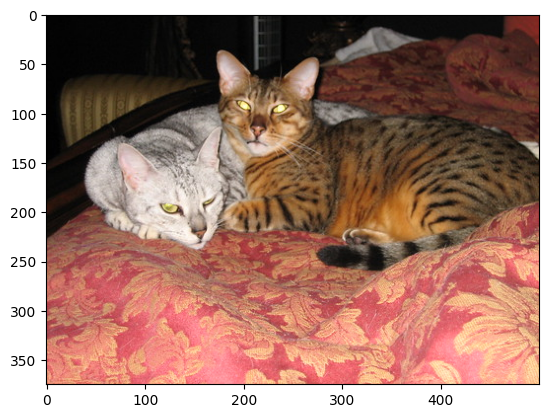

In [50]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [51]:
input_image = dataset[index][0].view(1, 3, 224, 224)
densenet121.to(device)
output = densenet121(input_image.to(device)).cpu()
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [11.899135 10.017799  9.186234]


# Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 

More precisely, you should provide a function: `show_grad_cam(image: torch.tensor) -> None` that displays something like this:
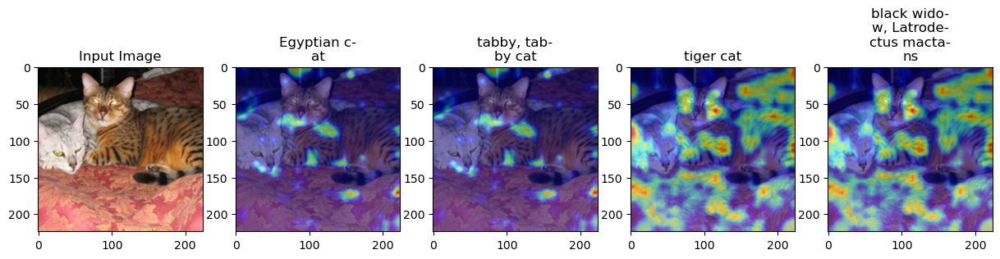
where the heatmap will be correct (here it is just an example) and the first 3 classes are the top-3 predicted classes and the last is the least probable class according to the model.

* **Comment your code**: Your code should be easy to read and follow. Please comment your code, try to use the NumPy Style Python docstrings for your functions.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (with or without GPU) (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model densenet doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + Your heatmap will have the same size as the feature map. You need to scale up the heatmap to the resized image (224x224, not the original one, before the normalization) for better observation purposes. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link to the paper: [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | - 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

## Part 1: Grad-CAM implementation

In [62]:
model = densenet121

model = model.eval()


In [63]:
class GradCam:
    def __init__(self, model, layer, device="cpu"):
        """
        GradCam as described in the paper (for one specific layer)
        
        Parameters
        ----------
        model : torch model
            Torch model (densenet121 but should work with another one if the layer is well specified).
        layer : torch model
            The specific layer for Grad-CAM.
        device : str, optional, default "cpu"
            Device to run the model on. Either "cpu" or "cuda".
        """
        self.model = model.to(device)
        self.layer = layer
        self.device = device

    def _gradcam(self, data, cls):
        """
        The important function: apply the gradcam
        
        Parameters
        ----------
        data : torch.tensor
            Image tensor, shape: [1, 3, H, W] (should be normalized).
        cls : int
            Idx of the class to compute Grad-CAM for.
        
        Returns
        -------
        numpy.ndarray
            Heatmap as a numpy array.
        """
        activations = []

        def hook_fn(module, input, output):
            activations.append(output)

        hook = self.layer.register_forward_hook(hook_fn)

        # here (just above this message) we defined the hook, it will 'hook up' the latent representation of the data
        # inside the model
        data = data.to(self.device)

        output = self.model(data)
        score = output[0, cls]
        grads = torch.autograd.grad(score, activations)

        hook.remove()

        w = grads[0][0].mean(dim=[1, 2]) # we take the mean as described in the paper
        # why grad[0][0]? torch.autograd.grad return a tuple and here since activations is a list with 1 element
        # the tuple length is 1, so we use grad[0] to have access to the tensor of the gradients. then,
        # since we have a batchsize of 1, the grad will have the shape 1, ... (note we can also simply do grads[0].squeeze(0)) 

        alpha = torch.matmul(w, activations[0].squeeze(0).view(activations[0].size(1), -1))
        alpha = alpha.view(activations[0].size(2), activations[0].size(3)).cpu().detach().numpy()
        l_c = np.maximum(alpha, 0)

        return l_c

    @staticmethod
    def _denormalize(img):
        """
        Unnormalize the img (we use it before we want to plot it from the tensor).
        
        Parameters
        ----------
        img : torch.tensor
            Image tensor of shape [3, H, W].
        
        Returns
        -------
        numpy.ndarray
            Unnormalized image, permuted and converted to a numpy array.
        """
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

        img = img.clone().detach().cpu() * std + mean
        img = torch.clamp(img, 0, 1)
        return img.permute(1, 2, 0).numpy()

    def show_gradcam(self, img, k=3, show_last=True):
        """     
        Parameters
        ----------
        img : torch.tensor
            Image tensor of shape [3, H, W].
        k : int, optional, default 3
            Number of top classes to display.
        show_last : bool, optional, default True
            If True, also display the least probable class.
        """
        img = img.to(self.device)
        probs_all = nn.Softmax(dim=1)(self.model(img.unsqueeze(0)))
        probs, clss = torch.topk(probs_all, k)
        image = self._denormalize(img)
        num_plots = k + 2 if show_last else k + 1

        plt.figure(figsize=(12, 3 * num_plots))
        plt.subplot(1, num_plots, 1)
        plt.imshow(image)
        plt.title("Original Img", fontsize=10)
        plt.axis('off')

        for i, (p, c) in enumerate(zip(probs[0], clss[0])):
            plt.subplot(1, num_plots, i + 2)
            l_c = self._gradcam(img.unsqueeze(0), c)
            l_c = Image.fromarray(l_c)
            l_c = l_c.resize((image.shape[1], image.shape[0]), resample=Image.BILINEAR)

            class_name = "\n".join(textwrap.wrap(classes[c.item()], width=20))
            txt = f"\n{p.item() * 100:.2f}%"
            plt.title(class_name + txt, fontsize=10)
            plt.axis('off')
            plt.imshow(image)
            plt.imshow(np.array(l_c), alpha=0.5, cmap='jet')

        if show_last:
            least_prob_class = torch.argmin(probs_all, dim=1).item()
            least_prob = probs_all[0, least_prob_class].item()
            plt.subplot(1, num_plots, num_plots)
            l_c = self._gradcam(img.unsqueeze(0), least_prob_class)
            l_c = Image.fromarray(l_c)
            l_c = l_c.resize((image.shape[1], image.shape[0]), resample=Image.BILINEAR)

            class_name = "\n".join(textwrap.wrap(classes[least_prob_class], width=20))
            txt = f"\n{least_prob * 100:.2f}%"
            plt.title(f"Least Probable:\n{class_name}" + txt, fontsize=10)
            plt.axis('off')
            plt.imshow(image)
            plt.imshow(np.array(l_c), alpha=0.5, cmap='jet')

        plt.tight_layout()
        plt.show()

    def show_examples(self, dataset, n_examples=2, show_last=True, seed=None):
        """
        Run gradcam on random samples of the dataset.

        Parameters
        ----------
        dataset : torch dataset
            Dataset of images, where each item is a tuple (image, class).
        n_examples : int, optional, default 2
            Number of examples to show.
        show_last : bool, optional, default True
            If True, also display the least probable class.
        seed : int, optional, default None
            Random seed for reproducibility.
        """
        if seed is not None:
            np.random.seed(seed)
            # random seed for interpretation, if we interpret a specific image 
        num_columns = 4 + show_last  # 3 classes + 1 optional least probable class
        plt.figure(figsize=(15, int((5 + show_last) * n_examples)))
        idxs = np.random.choice(len(dataset.imgs), n_examples)
        for j in trange(n_examples):
            idx = idxs[j]
            image = Image.open(dataset.imgs[idx][0]).convert('RGB')
            sample, _ = dataset[idx]

            probs_all = nn.Softmax(dim=1)(self.model(sample.unsqueeze(0).to(self.device)))
            probs, clss = torch.topk(probs_all, 3)

            plt.subplot(n_examples, num_columns, j * num_columns + 1)
            plt.imshow(image)
            plt.title(f"Original Img", fontsize=10)
            plt.axis('off')

            for i, (p, c) in enumerate(zip(probs[0], clss[0])):

                plt.subplot(n_examples, num_columns, j * num_columns + i + 2)
                l_c = self._gradcam(sample.unsqueeze(0), c)
                l_c = Image.fromarray(l_c)
                l_c = l_c.resize(image.size, resample=Image.BILINEAR)

                class_name = "\n".join(textwrap.wrap(classes[c.item()], width=35))
                txt = f"\n{p.item() * 100:.2f}%"
                plt.title(class_name + txt, fontsize=10)
                plt.axis('off')
                plt.imshow(image)
                plt.imshow(np.array(l_c), alpha=0.5, cmap='jet')

            if show_last:
                least_prob_class = torch.argmin(probs_all, dim=1).item()
                least_prob = probs_all[0, least_prob_class].item()

                plt.subplot(n_examples, num_columns, j * num_columns + num_columns)
                l_c = self._gradcam(sample.unsqueeze(0), least_prob_class)
                l_c = Image.fromarray(l_c)
                l_c = l_c.resize(image.size, resample=Image.BILINEAR)

                raw_txt = f"Least Probable: {classes[least_prob_class]} ({least_prob * 100:.2f}%)"
                txt = "\n".join(textwrap.wrap(raw_txt, width=35))
                plt.title(txt, fontsize=10)
                plt.axis('off')
                plt.imshow(image)
                plt.imshow(np.array(l_c), alpha=0.5, cmap='jet')

        plt.tight_layout()
        plt.show()


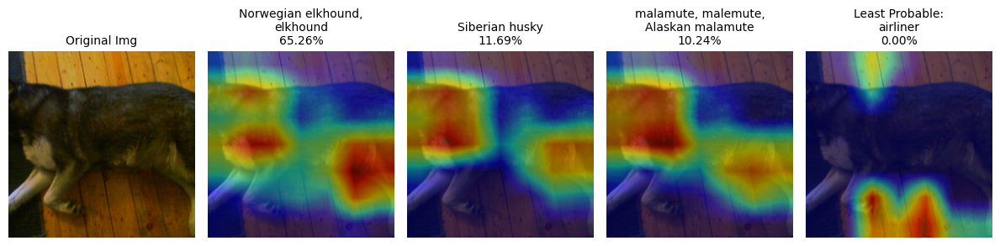

In [64]:
gradcam = GradCam(model, model.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_gradcam(dataset[3][0], 3)

## Part 2: Try it on a few (1 to 3) images and comment

  0%|          | 0/3 [00:00<?, ?it/s]

100%|██████████| 3/3 [00:02<00:00,  1.33it/s]


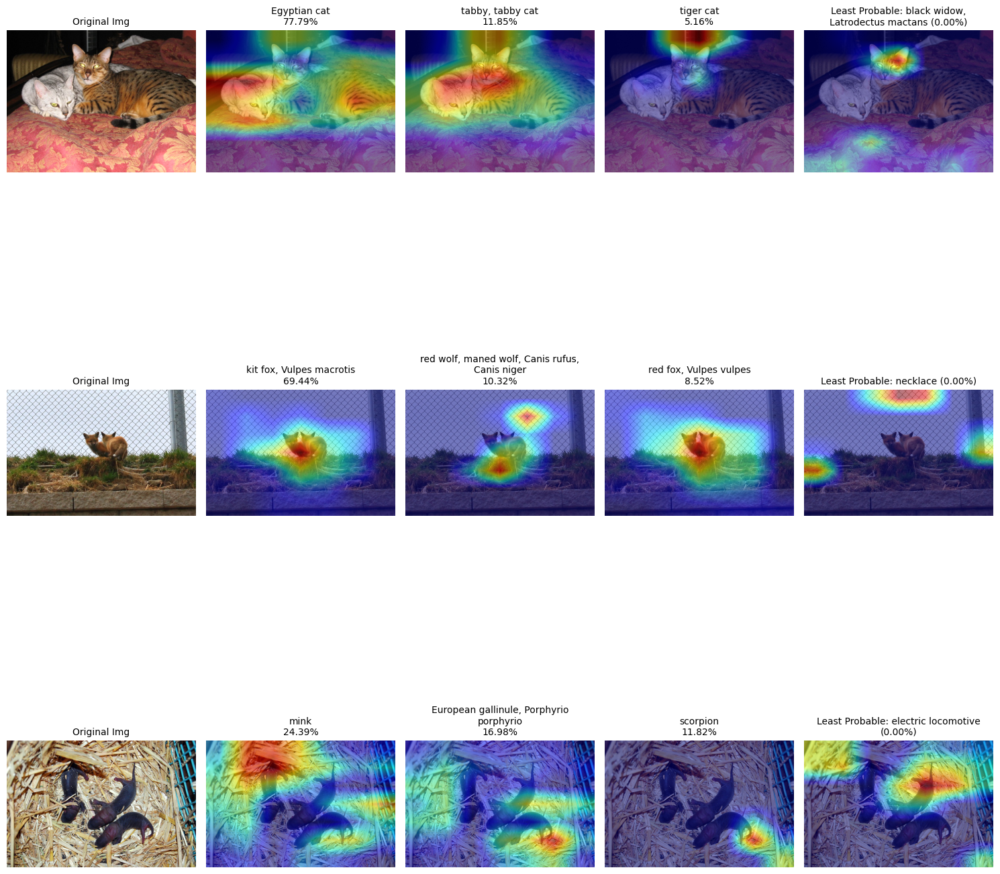

In [65]:
gradcam = GradCam(model, model.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_examples(dataset, 3, seed=1)

### Comments

Across the three presented examples, we observe that in the most probable classes, the model generally does a good job of identifying the key elements that contribute to image classification. For instance, in the image featuring two cats, the predictions vary depending on which cat the model focuses on the most.

However, in some cases, the model does not seem to focus on the relevant pixels. For example, in the image of the mink, Grad-CAM does not properly localize the animal. Overall, though, the results remain fairly satisfactory for the chosen layer.

That being said, when Grad-CAM performs less effectively, it is difficult to determine whether this is due to the model itself (DenseNet) or the Grad-CAM algorithm—potentially because of a suboptimal choice of layer, for example.

## Part 3: Try GradCAM on others convolutional layers, describe and comment the results

In [66]:
# As taught in class the first layers usually extract general features while when we go deeper
# the convolutions focus on more specific features. In another paper that i red (patchcore https://arxiv.org/abs/2106.08265)
# that use the latent space for anomaly detection, they say that the last layers are focus on the task of the model
# (here classification). In part 2, we took the last layers for grad cam and the results where not so bad 
# but if we take some layers that come sooner, we might have poorer results


 33%|███▎      | 1/3 [00:00<00:01,  1.33it/s]

100%|██████████| 3/3 [00:02<00:00,  1.13it/s]


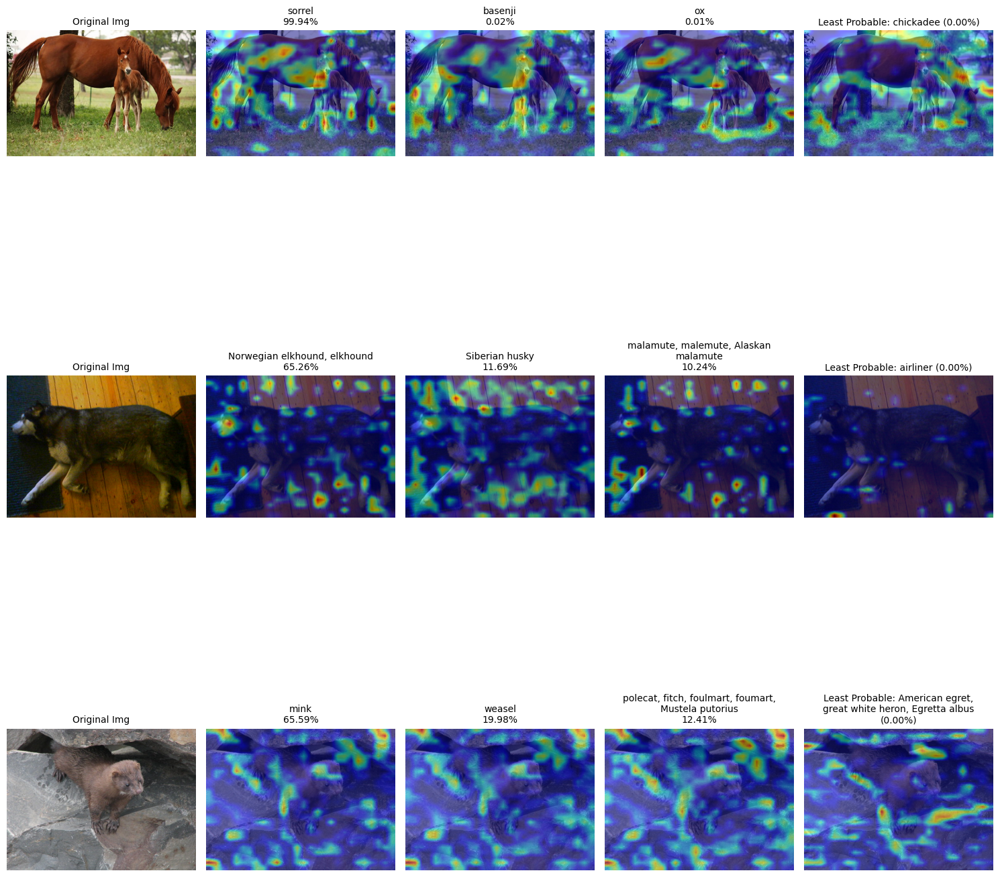

In [67]:
# Block 2 layer 3 conv 2
gradcam = GradCam(model, model.features.denseblock2.denselayer3.conv2, device=device)
gradcam.show_examples(dataset, 3, seed=3)

100%|██████████| 3/3 [00:02<00:00,  1.26it/s]


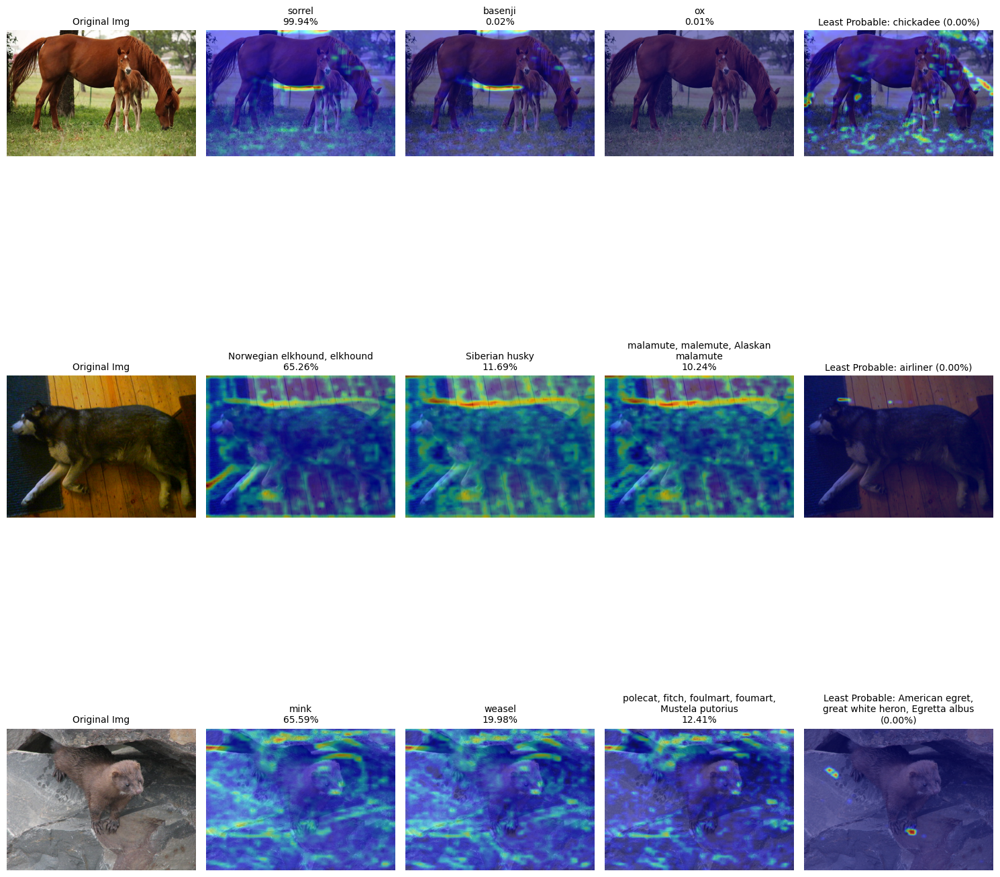

In [68]:
# Block 1 layer 2 conv 1
gradcam = GradCam(model, model.features.denseblock1.denselayer2.conv1, device=device)
gradcam.show_examples(dataset, 3, seed=3)

100%|██████████| 3/3 [00:02<00:00,  1.26it/s]


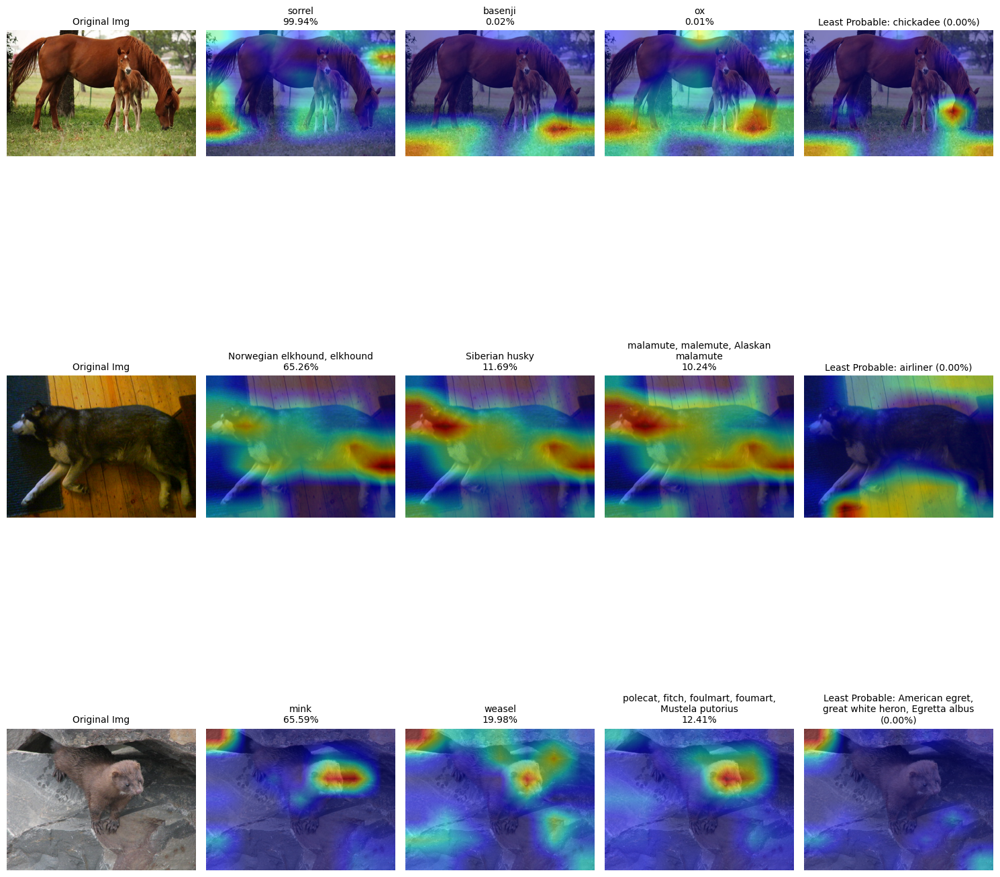

In [69]:
# Block 4 layer 5 conv 1
gradcam = GradCam(model, model.features.denseblock4.denselayer5.conv1, device=device)
gradcam.show_examples(dataset, 3, seed=3)

### Comments

We tested three different network layers—early, intermediate, and final—and the findings appear to confirm our earlier intuition. When using layers from the early stages of the model, we struggle to accurately localize the key features that contribute to classification. Similarly, the results from an intermediate layer are less impressive than those obtained from the final layers.

However, when selecting a different convolution from the last layer, the results appear similar to those of the second convolution. This suggests a potential limitation of the model: the choice of convolutional layer is crucial, and selecting this hyperparameter can be challenging, especially in large models

## Part 4: Try GradCAM on `9928031928.png` , describe and comment the results

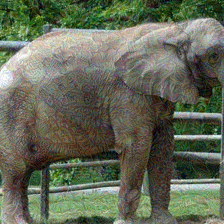

In [70]:
input_image = Image.open("./data/TP2_images/TP2_images/9928031928.png").convert('RGB')
input_image

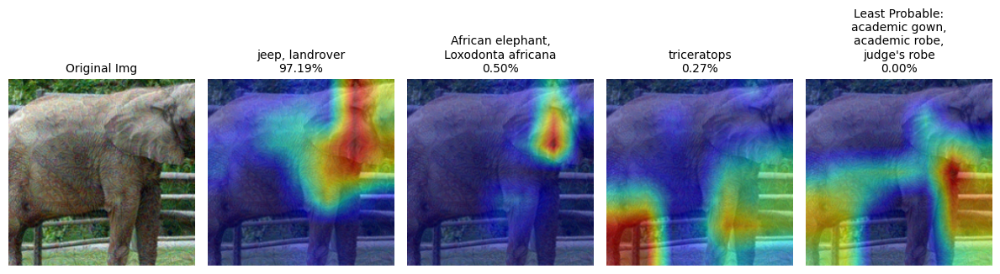

In [71]:
gradcam = GradCam(model, model.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_gradcam(dataset[-1][0], 3)

 ### Comments

 In this example, we observe that the model incorrectly classifies the image of an elephant. Intuitively, this could be due to the absence of the elephant’s trunk in the image. The model predicts a Range Rover, and Grad-CAM visualization shows that the model focused on a part of the elephant’s ear.

Although it is difficult to see how this ear could resemble a Range Rover, it is possible that the highlighted red area might be interpreted as the lower part of a Range Rover, with the silhouette of a wheel. Additionally, we notice that when the model correctly classifies the image, it focuses on a smaller region of the ear.

## Part 5: What are the principal contributions of GradCAM (the answer is in the paper) ?

The main contributions of Grad-CAM are as follows:

* The model can be applied to a wide variety of CNN-based architectures to extract the "vision" of a model and partially justify its classification decisions.

* The paper also explores whether Grad-CAM can help users build trust in model predictions, for example, by comparing two models that produce the same result.

* Additionally, the authors demonstrate that Grad-CAM is a strict generalization of the Class Activation Mapping (CAM) algorithm.

* Finally, the authors show how Grad-CAM can help identify which layers are responsible for certain decisions by naming them. These layers act as "detectors" (e.g., a layer might be specialized in detecting sky features). This allows researchers to "name" specific neurons or layers based on their activity in response to certain attributes.

## Bonus 5: What are the main differences between DenseNet and ResNet ?

First, the main thing with resnet is that it use residual connection between layer (in the intermediate layer, the model is not in the form x = f(x) but x = f(x)+x, nb: I know that a mathematician would tear their hair out seeing this; let's say I wrote the formulas like a computer scientist). While densenet is caracterised by the fact that almost all layers get directly the output of the previous layer (in classical neural networks, the information of layer1 is passed through layer10 by layer2, layer3 etc... In densenet, we have a direct connection between layer 1 and layer10). From this fact, we have numerous consequences:

* Number of Parameters
ResNet generally has a higher number of parameters compared to DenseNet for a similar depth, as each layer learns transformations independently while densenet typically requires fewer parameters since layers share features learned by previous layers, reducing overall parameter redundancy.
* Complexity
ResNet: Computational complexity can be higher due to the larger number of parameters and the lack of direct feature sharing between all layers. However, in densenet we may require more memory to store intermediate feature maps.

ResNet and DenseNet take different approaches to improving deep network training. ResNet focuses on residual connections to ease learning in very deep networks, while DenseNet maximizes feature reuse through dense connections, leading to parameter efficiency and enhanced gradient propagation.